**Goal: rerun pipeline with same hyperparams, swap label generation method, add blur, compare metrics + compute time.**

**Setup & Imports**

In [1]:
!pip -q install rasterio segmentation-models-pytorch==0.3.3 torchmetrics==1.3.0 albumentations opencv-python scipy tifffile


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 8.5 MB/s eta 0:00:00
Reason for being yanked: <none given>
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 62.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 80.7 MB/s eta 0:00:00


In [2]:
# Core
import os, json, time, random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# Imaging / Geo
import rasterio
from rasterio.plot import show
from tqdm import tqdm
import tifffile
from scipy.ndimage import gaussian_filter
from PIL import Image

# DL
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# Augmentation
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Models
import segmentation_models_pytorch as smp
import torchvision
from torchvision.models.segmentation import DeepLabV3_ResNet50_Weights

# Metrics
import time
from torchmetrics.classification import MulticlassF1Score, MulticlassJaccardIndex
from torchmetrics.functional.classification import multiclass_accuracy
from torchmetrics.classification import (
    MulticlassF1Score,
    MulticlassJaccardIndex,
    MulticlassPrecision,
    MulticlassRecall,
    MulticlassAccuracy
)

# Reproducibility + device
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)


Device: cuda


**Configurations and Run Folders**

In [3]:
CONFIG = {
    "tile_size": 512,
    "batch_size": 4,
    "epochs": 10,
    "optimizer": "AdamW",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "loss": "CrossEntropy + Dice",
    "seed": SEED,
    "device": DEVICE,
    "select_best_by": "val_mean_iou"  # best epoch selection rule
}

# Classes: 0,1,2,3 for training labels
CLASS_NAMES = ["water", "impervious", "sparse_veg", "dense_veg"]
NUM_CLASSES = len(CLASS_NAMES)

print("NUM_CLASSES:", NUM_CLASSES)
print("CLASS_NAMES:", CLASS_NAMES)


# Run folder helpers

RUNS_DIR = Path("runs")
RUNS_DIR.mkdir(exist_ok=True)

def make_run_dir(model_name: str) -> Path:
    stamp = time.strftime("%Y%m%d_%H%M%S")
    run_dir = RUNS_DIR / model_name / f"run_{stamp}"
    run_dir.mkdir(parents=True, exist_ok=True)
    (run_dir / "checkpoints").mkdir(exist_ok=True)
    (run_dir / "pred_viz").mkdir(exist_ok=True)
    (run_dir / "splits").mkdir(exist_ok=True)
    return run_dir

def save_config(run_dir: Path, extra: dict = None):
    cfg = dict(CONFIG)
    cfg.update({
        "num_classes": NUM_CLASSES,
        "class_names": CLASS_NAMES
    })
    if extra:
        cfg.update(extra)
    with open(run_dir / "config.json", "w") as f:
        json.dump(cfg, f, indent=2)

print("Config ready. Runs will save under:", RUNS_DIR.resolve())


NUM_CLASSES: 4
CLASS_NAMES: ['water', 'impervious', 'sparse_veg', 'dense_veg']
Config ready. Runs will save under: /content/runs


**Mount Google Drive & Locate TIFF Images**

In [8]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)


Mounted at /content/drive


In [9]:
DATA_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo")

tif_paths = sorted(DATA_DIR.glob("*.tif"))
print(f"Number of TIFF files: {len(tif_paths)}")
for p in tif_paths[:5]:
    print(p.name)


Number of TIFF files: 15
930645_se.tif
930650_ne.tif
930660_se.tif
930665_se.tif
930670_ne.tif


**NDVI + NDWI + BLUR Labeling Functions**

In [6]:
def compute_ndvi(bands, red_idx=1, nir_idx=4):
    """
    bands: (bands, H, W) from rasterio
    red_idx, nir_idx are 1-based
    """
    red = bands[red_idx - 1].astype("float32")
    nir = bands[nir_idx - 1].astype("float32")
    ndvi = (nir - red) / (nir + red + 1e-6)
    return np.clip(ndvi, -1.0, 1.0)

def compute_ndwi(bands, green_idx=2, nir_idx=4):
    """
    NDWI = (Green - NIR) / (Green + NIR)
    """
    green = bands[green_idx - 1].astype("float32")
    nir = bands[nir_idx - 1].astype("float32")
    ndwi = (green - nir) / (green + nir + 1e-6)
    return np.clip(ndwi, -1.0, 1.0)

def blur_multiband(bands, sigma=1.0):
    """
    Apply Gaussian blur per band
    bands: (bands, H, W)
    """
    blurred = np.empty_like(bands, dtype=np.float32)
    for b in range(bands.shape[0]):
        blurred[b] = gaussian_filter(bands[b].astype("float32"), sigma=sigma)
    return blurred


**LABELING GENERATION FOR MASKS(0-3)**

In [26]:
def ndvi_ndwi_to_mask(ndvi, ndwi):
    """
    Output labels:
    0 = Water
    1 = Impervious / Bare
    2 = Sparse vegetation
    3 = Dense vegetation
    """
    UNASSIGNED = 255
    mask = np.full(ndvi.shape, UNASSIGNED, dtype=np.uint8)

    # 0: Water (highest priority)
    water = (ndwi > 0.1) & (ndvi < 0.1)
    mask[water] = 0

    # 3: Dense vegetation
    mask[ndvi >= 0.5] = 3

    # 2: Sparse vegetation
    mask[(ndvi >= 0.2) & (ndvi < 0.5)] = 2

    # 1: Impervious / bare = only the pixels still UNASSIGNED
    mask[mask == UNASSIGNED] = 1

    return mask


**Visualize RGB and NDVI for a Sample TIFF**

Unique labels: [0 1 2 3]


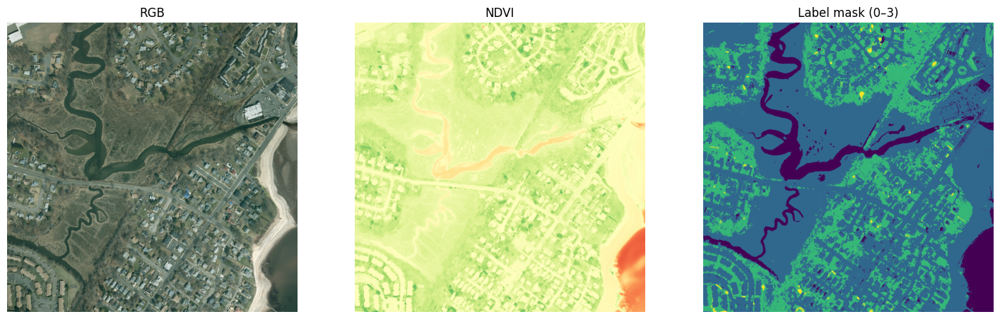

In [33]:
sample_path = tif_paths[0]

with rasterio.open(sample_path) as src:
    bands = src.read()  # (bands, H, W)

# Optional blur (experiment toggle)
bands_blur = blur_multiband(bands, sigma=1.0)

ndvi = compute_ndvi(bands_blur)
ndwi = compute_ndwi(bands_blur)
mask = ndvi_ndwi_to_mask(ndvi, ndwi)

print("Unique labels:", np.unique(mask))

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].imshow(np.transpose(bands[:3], (1, 2, 0)) / np.max(bands[:3]))
axs[0].set_title("RGB")

axs[1].imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
axs[1].set_title("NDVI")

axs[2].imshow(mask, vmin=0, vmax=3)
axs[2].set_title("Label mask (0–3)")

for ax in axs:
    ax.axis("off")

plt.show()


**Sanity check: RGB, NDVI, NDWI, mask**

Using sample: 930645_se.tif
Bands, H, W: (4, 5000, 5000)
Unique labels + counts: {0: 2184020, 1: 16090545, 2: 6617825, 3: 107610}


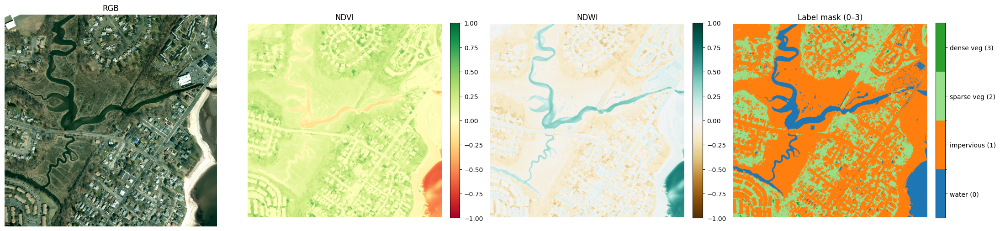

In [34]:
sample_path = tif_paths[0]
print("Using sample:", sample_path.name)

with rasterio.open(sample_path) as src:
    bands = src.read()  # (bands, H, W)

print("Bands, H, W:", bands.shape)

# ---- Blur ----
USE_BLUR = True
sigma = 1.0
bands_for_index = blur_multiband(bands, sigma=sigma) if USE_BLUR else bands

# ---- Compute indices ----
ndvi = compute_ndvi(bands_for_index, red_idx=1, nir_idx=4)
ndwi = compute_ndwi(bands_for_index, green_idx=2, nir_idx=4)

mask = ndvi_ndwi_to_mask(ndvi, ndwi)

labels, counts = np.unique(mask, return_counts=True)
print("Unique labels + counts:", dict(zip(labels.tolist(), counts.tolist())))

# ---- RGB display (robust scaling) ----
rgb = np.transpose(bands[:3], (1, 2, 0)).astype(np.float32)
lo, hi = np.percentile(rgb, (2, 98))
rgb_disp = np.clip((rgb - lo) / (hi - lo + 1e-6), 0, 1)

# ---- Colormap for mask ----
# 0 water, 1 impervious, 2 sparse veg, 3 dense veg
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# ---- Plot ----
fig, axs = plt.subplots(1, 4, figsize=(22, 6))

axs[0].imshow(rgb_disp)
axs[0].set_title("RGB")

im1 = axs[1].imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
axs[1].set_title("NDVI")
plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

im2 = axs[2].imshow(ndwi, cmap="BrBG", vmin=-1, vmax=1)
axs[2].set_title("NDWI")
plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

im3 = axs[3].imshow(mask, cmap=cmap_mask, norm=norm_mask)
axs[3].set_title("Label mask (0–3)")
cbar = plt.colorbar(im3, ax=axs[3], fraction=0.046, pad=0.04, ticks=[0,1,2,3])
cbar.ax.set_yticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()


**Saving Masks as GeoTIFF**

In [35]:
"""
Saved masks(0–3) for each TIFF as a GeoTIFF.
This will help ensure spatial alignmentpixel resolution is the same, CRS projection, and the exact pixel to map alignment.
Guarantee that mask pixel (i,j) will line up exactly with image pixel (i,j)
"""

# Toggle blur for on/off
USE_BLUR = True
SIGMA = 1.0

# Output folder
LABEL_DIR.mkdir(parents=True, exist_ok=True)

def mask_out_path(tif_path):
    # Example: 930645_se.tif -> 930645_se_mask_0_3.tif
    return LABEL_DIR / f"{tif_path.stem}_mask_0_3.tif"

saved = 0
skipped = 0

for tif_path in tqdm(tif_paths, desc="Generating full-res masks"):
    out_path = mask_out_path(tif_path)

    # Skip if already created (avoid redoing work)
    if out_path.exists():
        skipped += 1
        continue

    with rasterio.open(tif_path) as src:
        bands = src.read()  # (bands, H, W)

        # Optional blur (per-band)
        bands_for_index = blur_multiband(bands, sigma=SIGMA) if USE_BLUR else bands

        # Indices (assuming your convention: 1=Red, 2=Green, 4=NIR)
        ndvi = compute_ndvi(bands_for_index, red_idx=1, nir_idx=4)
        ndwi = compute_ndwi(bands_for_index, green_idx=2, nir_idx=4)

        # Mask (uint8 with values 0..3)
        mask = ndvi_ndwi_to_mask(ndvi, ndwi).astype(np.uint8)

        # Write single-band mask GeoTIFF
        out_profile = src.profile.copy()
        out_profile.update(
            count=1,
            dtype="uint8",
            nodata=255,
            compress="lzw"
        )

        with rasterio.open(out_path, "w", **out_profile) as dst:
            dst.write(mask, 1)

    saved += 1

print(f"Done. Saved: {saved}, Skipped (already existed): {skipped}")
print("Example output:", mask_out_path(tif_paths[0]))


Generating full-res masks: 100%|██████████| 15/15 [01:56<00:00,  7.76s/it]

Done. Saved: 15, Skipped (already existed): 0
Example output: /content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo/labels_ndvi_ndwi/930645_se_mask_0_3.tif


**Tiling 512 x 512**

In [47]:
def tile_image_and_mask(image, mask, tile_size=512):
    """
    image: (C, H, W)   e.g., RGB as (3, H, W)
    mask:  (H, W)      uint8 labels 0..3 (and possibly 255 if you used UNASSIGNED)
    returns: list of (image_tile, mask_tile)
             image_tile: (C, tile_size, tile_size)
             mask_tile:  (tile_size, tile_size)
    """
    C, H, W = image.shape
    tiles = []

    max_y = (H // tile_size) * tile_size
    max_x = (W // tile_size) * tile_size

    for y in range(0, max_y, tile_size):
        for x in range(0, max_x, tile_size):
            img_tile = image[:, y:y+tile_size, x:x+tile_size]
            msk_tile = mask[y:y+tile_size, x:x+tile_size]

            if img_tile.shape[1:] == (tile_size, tile_size) and msk_tile.shape == (tile_size, tile_size):
                tiles.append((img_tile, msk_tile))

    return tiles

In [48]:
TILE_SIZE = 512

DATA_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo")
MASK_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo/labels_ndvi_ndwi")

tif_paths = sorted(DATA_DIR.glob("*.tif"))
print("Num image TIFFs:", len(tif_paths))

sample_path = tif_paths[0]
stem = sample_path.stem
mask_path = MASK_DIR / f"{stem}_mask_0_3.tif"

print("Sample image:", sample_path.name)
print("Sample mask :", mask_path.name, "| exists:", mask_path.exists())

# Read image + mask
with rasterio.open(sample_path) as src_img:
    bands = src_img.read()  # (4, H, W)
    print("Image bands shape:", bands.shape)
    rgb = bands[:3, :, :]   # (3, H, W)

with rasterio.open(mask_path) as src_msk:
    mask = src_msk.read(1)  # (H, W)
    print("Mask shape:", mask.shape, "dtype:", mask.dtype)

# Ensure expected dtype for class labels
mask = mask.astype(np.uint8)

# Tile
tiles = tile_image_and_mask(rgb, mask, tile_size=TILE_SIZE)
print("Num tiles:", len(tiles))

# Inspect first tile
rgb_t, m_t = tiles[0]
labels, counts = np.unique(m_t, return_counts=True)

print("Tile RGB shape:", rgb_t.shape)
print("Tile mask shape:", m_t.shape)
print("Tile unique labels:", labels)


Num image TIFFs: 15
Sample image: 930645_se.tif
Sample mask : 930645_se_mask_0_3.tif | exists: True
Image bands shape: (4, 5000, 5000)
Mask shape: (5000, 5000) dtype: uint8
Num tiles: 81
Tile RGB shape: (3, 512, 512)
Tile mask shape: (512, 512)
Tile unique labels: [0 1 2 3]


**Saving RGB Tiles and Mask Tiles as PNG to Google Drive**

In [51]:
TILE_SIZE = 512

# Inputs
DATA_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo")
MASK_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/RGB_Prep_Demo/labels_ndvi_ndwi")

tif_paths = sorted(DATA_DIR.glob("*.tif"))
print("Num image TIFFs:", len(tif_paths))

# Outputs
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_OUT = TILES_BASE / "images"
MSK_OUT = TILES_BASE / "masks"
IMG_OUT.mkdir(parents=True, exist_ok=True)
MSK_OUT.mkdir(parents=True, exist_ok=True)

print("Saving RGB tiles to:", IMG_OUT)
print("Saving mask tiles to:", MSK_OUT)

tile_count = 0
skipped = 0
missing_masks = 0

for tif_path in tif_paths:
    stem = tif_path.stem
    mask_path = MASK_DIR / f"{stem}_mask_0_3.tif"

    if not mask_path.exists():
        print("Missing mask for:", stem)
        missing_masks += 1
        continue

    # --- Read RGB (3,H,W) from 4-band TIFF ---
    with rasterio.open(tif_path) as src_img:
        bands = src_img.read()          # (4, H, W)
        rgb = bands[:3, :, :]           # (3, H, W)

    # --- Read mask (H,W) ---
    with rasterio.open(mask_path) as src_msk:
        mask = src_msk.read(1)          # (H, W)

    # Ensure matching spatial size
    H_img, W_img = rgb.shape[1], rgb.shape[2]
    H_msk, W_msk = mask.shape[0], mask.shape[1]
    H = min(H_img, H_msk)
    W = min(W_img, W_msk)
    rgb = rgb[:, :H, :W]
    mask = mask[:H, :W].astype(np.uint8)

    # Normalize RGB per-image (same as visualization)
    rgb_hw3 = np.transpose(rgb, (1, 2, 0)).astype(np.float32)  # (H,W,3)
    lo, hi = np.percentile(rgb_hw3, (2, 98))
    rgb_norm = np.clip((rgb_hw3 - lo) / (hi - lo + 1e-6), 0, 1)
    rgb_u8 = (rgb_norm * 255).astype(np.uint8)

    # Drop incomplete borders (non-overlapping grid)
    max_y = (H // TILE_SIZE) * TILE_SIZE
    max_x = (W // TILE_SIZE) * TILE_SIZE

    for y in range(0, max_y, TILE_SIZE):
        for x in range(0, max_x, TILE_SIZE):
            rgb_tile = rgb_u8[y:y+TILE_SIZE, x:x+TILE_SIZE, :]
            msk_tile = mask[y:y+TILE_SIZE, x:x+TILE_SIZE]

            img_name = f"{stem}_y{y}_x{x}.png"
            msk_name = f"{stem}_y{y}_x{x}_mask.png"
            img_fp = IMG_OUT / img_name
            msk_fp = MSK_OUT / msk_name

            # Skip if already written
            if img_fp.exists() and msk_fp.exists():
                skipped += 1
                continue

            Image.fromarray(rgb_tile).save(img_fp)
            Image.fromarray(msk_tile).save(msk_fp)

            tile_count += 1

print("\nDone.")
print("New tiles saved:", tile_count)
print("Tiles skipped (already existed):", skipped)
print("Missing masks:", missing_masks)


Num image TIFFs: 15
Saving RGB tiles to: /content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512/images
Saving mask tiles to: /content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512/masks

Done.
New tiles saved: 1215
Tiles skipped (already existed): 0
Missing masks: 0


**Sanity Check for Tiles**

Num image tiles: 1215
930645_se_y3584_x4096.png unique mask labels: [0 1 2 3]
930660_se_y2048_x1536.png unique mask labels: [0 1 2 3]
930675_se_y2560_x3584.png unique mask labels: [1 2 3]


/tmp/ipython-input-3298826129.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


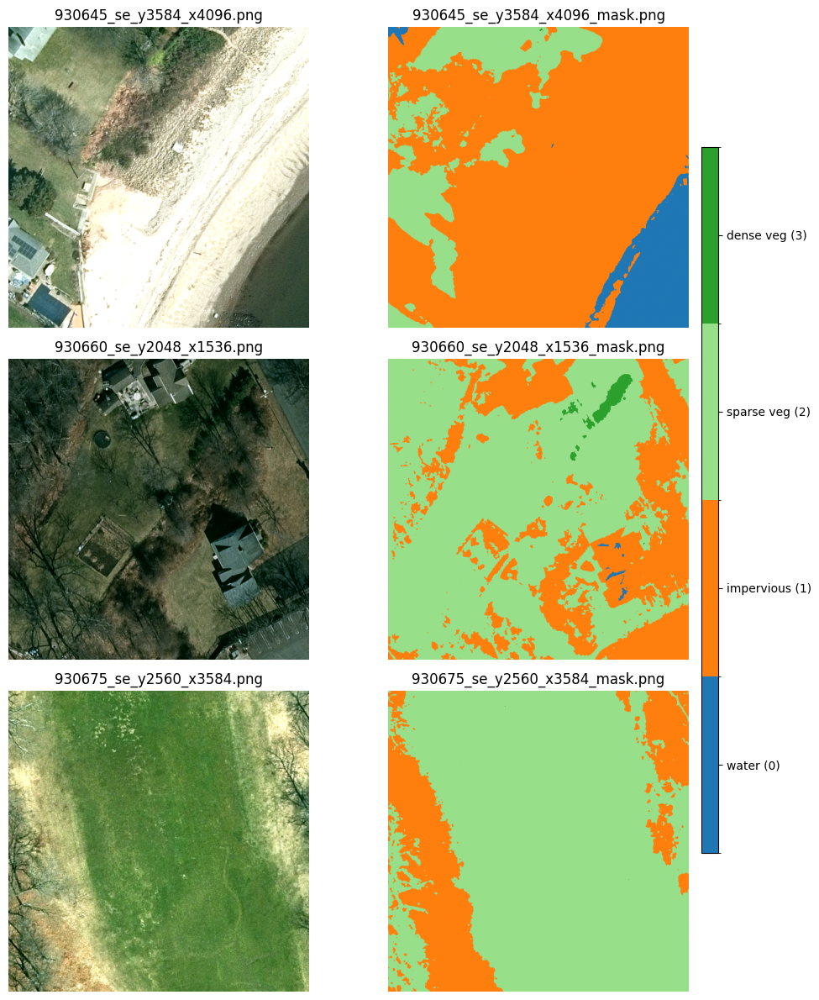

In [56]:
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_OUT = TILES_BASE / "images"
MSK_OUT = TILES_BASE / "masks"

img_files = sorted(list(IMG_OUT.glob("*.png")))
print("Num image tiles:", len(img_files))

# pick a few random tiles
k = 3
sample_imgs = random.sample(img_files, k)


class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]  # 0 water,1 imperv,2 sparse,3 dense
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm(boundaries=[-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

fig, axs = plt.subplots(k, 2, figsize=(10, 4*k))

for i, img_fp in enumerate(sample_imgs):
    msk_fp = MSK_OUT / f"{img_fp.stem}_mask.png"
    if not msk_fp.exists():
        print("Missing mask tile for:", img_fp.name)
        continue

    rgb = np.array(Image.open(img_fp))
    mask = np.array(Image.open(msk_fp))

    axs[i, 0].imshow(rgb)
    axs[i, 0].set_title(img_fp.name)
    axs[i, 0].axis("off")

    im = axs[i, 1].imshow(mask, cmap=cmap_mask, norm=norm_mask)
    axs[i, 1].set_title(msk_fp.name)
    axs[i, 1].axis("off")

    # print mask unique labels for each tile (quick check)
    u = np.unique(mask)
    print(img_fp.name, "unique mask labels:", u)

# one legend/colorbar for the mask column
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(
    im,
    cax=cax,
    ticks=[0, 1, 2, 3]
)
cbar.set_ticklabels([
    "water (0)",
    "impervious (1)",
    "sparse veg (2)",
    "dense veg (3)"
])
plt.tight_layout()
plt.show()


**Train/Val/Test Split**

In [10]:
# ---- Paths ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

assert IMG_DIR.exists(), f"Missing: {IMG_DIR}"
assert MSK_DIR.exists(), f"Missing: {MSK_DIR}"

# ---- Pairs ----
img_files = sorted(IMG_DIR.glob("*.png"))

pairs = []
missing = 0
for img_fp in img_files:
    msk_fp = MSK_DIR / f"{img_fp.stem}_mask.png"
    if not msk_fp.exists():
        missing += 1
        continue
    pairs.append((img_fp, msk_fp))

print("Num image tiles found:", len(img_files))
print("Paired tiles:", len(pairs))
print("Missing masks:", missing)

# ---- Split train/val/test ----
SEED = 42
random.seed(SEED)

idx = list(range(len(pairs)))
random.shuffle(idx)

train_ratio, val_ratio = 0.80, 0.10
n = len(idx)
train_end = int(train_ratio * n)
val_end   = int((train_ratio + val_ratio) * n)

train_idx = idx[:train_end]
val_idx   = idx[train_end:val_end]
test_idx  = idx[val_end:]

print(f"Split sizes -> train: {len(train_idx)}, val: {len(val_idx)}, test: {len(test_idx)}")


Num image tiles found: 1215
Paired tiles: 1215
Missing masks: 0
Split sizes -> train: 972, val: 121, test: 122


**Dataset Class + Data Augmentations + Data Loader**

In [11]:
# ---- Augmentations ----
# Train gets augmentation; Val/Test do not (only normalize + to tensor)
train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.10, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),  # keeps your existing [0,1] scale logic simple
    ToTensorV2()
])

eval_tf = A.Compose([
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
    ToTensorV2()
])


# ---- Dataset ----
class TileSegDataset(Dataset):
    """
    pairs: list[(img_fp, msk_fp)]
    indices: list[int] selecting which pairs belong to this split
    transform: Albumentations Compose (expects image HWC, mask HW)
    """
    def __init__(self, pairs, indices, transform=None):
        self.pairs = pairs
        self.indices = indices
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        img_fp, msk_fp = self.pairs[self.indices[i]]

        # RGB image uint8 (H,W,3)
        image = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)

        # mask uint8 (H,W) with labels {0,1,2,3}
        mask = np.array(Image.open(msk_fp), dtype=np.uint8)
        if mask.ndim == 3:          # safety (if saved as RGB accidentally)
            mask = mask[..., 0]

        # apply augmentations (mask stays integer labels)
        if self.transform is not None:
            out = self.transform(image=image, mask=mask)
            image = out["image"]                # torch float32 (3,H,W)
            mask  = out["mask"].long()          # torch int64 (H,W)
        else:
            # fallback (no albumentations): manual conversion
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
            mask  = torch.from_numpy(mask).long()

        return image, mask


# ---- Datasets + Loaders ----
BATCH_SIZE = 4

train_ds = TileSegDataset(pairs, train_idx, transform=train_tf)
val_ds   = TileSegDataset(pairs, val_idx,   transform=eval_tf)
test_ds  = TileSegDataset(pairs, test_idx,  transform=eval_tf)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ---- Quick sanity check ----
x, y = next(iter(train_loader))
print("Batch images:", x.shape, x.dtype)   # (B,3,512,512), float32
print("Batch masks :", y.shape, y.dtype)   # (B,512,512), int64
print("Unique labels in batch:", torch.unique(y))


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Batch images: torch.Size([4, 3, 512, 512]) torch.float32
Batch masks : torch.Size([4, 512, 512]) torch.int64
Unique labels in batch: tensor([0, 1, 2, 3])


**Metrics (F1,IoU,Precision/Recall per class, Pixel Accuracy)**

In [13]:
NUM_CLASSES = 4

def build_metrics(device):
    metrics = {
        "f1_macro": MulticlassF1Score(num_classes=NUM_CLASSES, average="macro").to(device),
        "f1_per_class": MulticlassF1Score(num_classes=NUM_CLASSES, average=None).to(device),

        "iou_macro": MulticlassJaccardIndex(num_classes=NUM_CLASSES, average="macro").to(device),
        "iou_per_class": MulticlassJaccardIndex(num_classes=NUM_CLASSES, average=None).to(device),

        "prec_per_class": MulticlassPrecision(num_classes=NUM_CLASSES, average=None).to(device),
        "rec_per_class": MulticlassRecall(num_classes=NUM_CLASSES, average=None).to(device),

        "pixel_acc": MulticlassAccuracy(num_classes=NUM_CLASSES, average="micro").to(device),
    }
    return metrics

@torch.no_grad()
def reset_metrics(metrics: dict):
    for m in metrics.values():
        m.reset()

@torch.no_grad()
def update_metrics(metrics: dict, preds: torch.Tensor, targets: torch.Tensor):
    """
    preds: (B,H,W) int64
    targets: (B,H,W) int64
    """
    for m in metrics.values():
        m.update(preds, targets)

@torch.no_grad()
def compute_metrics(metrics: dict):
    out = {}
    for k, m in metrics.items():
        val = m.compute()
        out[k] = val.detach().cpu()
    return out

**Training Loop(Epochs)**

In [14]:
def run_one_epoch(model, loader, optimizer, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    metrics = build_metrics(device)
    reset_metrics(metrics)

    total_loss = 0.0
    n_batches = 0

    start = time.perf_counter()

    for x, y in loader:
        x = x.to(device, non_blocking=True)   # (B,3,512,512)
        y = y.to(device, non_blocking=True)   # (B,512,512)

        if train:
            optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(train):
            logits = model(x)                 # expected (B,C,H,W)
            # Some torchvision seg models return dict: {"out": ...}
            if isinstance(logits, dict):
                logits = logits["out"]

            loss = combined_loss(logits, y)

            if train:
                loss.backward()
                optimizer.step()

        total_loss += loss.item()
        n_batches += 1

        preds = torch.argmax(logits, dim=1)   # (B,H,W)
        update_metrics(metrics, preds, y)

    elapsed = time.perf_counter() - start

    metrics_out = compute_metrics(metrics)
    avg_loss = total_loss / max(1, n_batches)

    return avg_loss, metrics_out, elapsed


In [15]:
def train_model(
    model,
    train_loader,
    val_loader,
    model_name: str,
    device,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
):
    results_dir = Path(results_dir)
    results_dir.mkdir(parents=True, exist_ok=True)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

    history = []
    best = {
        "epoch": None,
        "val_f1_macro": -1.0,
        "path_ckpt": None,
        "path_metrics": None
    }

    for epoch in range(1, epochs + 1):
        tr_loss, tr_metrics, tr_time = run_one_epoch(model, train_loader, optimizer, device, train=True)
        va_loss, va_metrics, va_time = run_one_epoch(model, val_loader, optimizer, device, train=False)

        # choose best by val mean F1 (macro)
        val_f1 = float(va_metrics["f1_macro"].item())

        row = {
            "epoch": epoch,
            "train_loss": tr_loss,
            "val_loss": va_loss,
            "train_time_sec": tr_time,
            "val_time_sec": va_time,

            "train_f1_macro": float(tr_metrics["f1_macro"].item()),
            "val_f1_macro": val_f1,

            "train_iou_macro": float(tr_metrics["iou_macro"].item()),
            "val_iou_macro": float(va_metrics["iou_macro"].item()),

            "val_pixel_acc": float(va_metrics["pixel_acc"].item()),

            "val_f1_per_class": va_metrics["f1_per_class"].tolist(),
            "val_iou_per_class": va_metrics["iou_per_class"].tolist(),
            "val_prec_per_class": va_metrics["prec_per_class"].tolist(),
            "val_rec_per_class": va_metrics["rec_per_class"].tolist(),
        }
        history.append(row)

        print(
            f"[{model_name}] Epoch {epoch:02d}/{epochs} | "
            f"val_f1={row['val_f1_macro']:.4f} val_iou={row['val_iou_macro']:.4f} "
            f"loss={row['val_loss']:.4f} | "
            f"time(train/val)={tr_time:.1f}s/{va_time:.1f}s"
        )

        if val_f1 > best["val_f1_macro"]:
            best["val_f1_macro"] = val_f1
            best["epoch"] = epoch

            ckpt_path = results_dir / f"{model_name}_best.pt"
            metrics_path = results_dir / f"{model_name}_best_metrics.json"

            torch.save(model.state_dict(), ckpt_path)
            with open(metrics_path, "w") as f:
                json.dump({"best": row, "history": history}, f, indent=2)

            best["path_ckpt"] = str(ckpt_path)
            best["path_metrics"] = str(metrics_path)

    print("\nBest epoch:", best["epoch"], "| Best val mean F1:", best["val_f1_macro"])
    print("Saved checkpoint:", best["path_ckpt"])
    print("Saved metrics:", best["path_metrics"])

    return best, history


**Loss Function (CE + Dice)**

In [16]:
ce_loss = nn.CrossEntropyLoss()

def dice_loss(logits, targets, num_classes=4, eps=1e-6):
    """
    logits: (B, C, H, W)
    targets: (B, H, W) with class labels
    """
    probs = F.softmax(logits, dim=1)              # (B,C,H,W)
    targets_oh = F.one_hot(targets, num_classes)  # (B,H,W,C)
    targets_oh = targets_oh.permute(0, 3, 1, 2).float()

    dims = (0, 2, 3)
    intersection = torch.sum(probs * targets_oh, dims)
    union = torch.sum(probs + targets_oh, dims)

    dice = (2 * intersection + eps) / (union + eps)
    return 1 - dice.mean()

def combined_loss(logits, targets):
    return ce_loss(logits, targets) + dice_loss(logits, targets)

**U-Net(SMP) Model**

In [66]:
MODEL_NAME = "FullUNet_23L"

ENCODER = "resnet34"
ENCODER_WEIGHTS = "imagenet"  # good default

model_unet = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3,
    classes=4,
    activation=None
).to(DEVICE)

print("Model:", MODEL_NAME)
print("Encoder:", ENCODER)

# ---- Train and save BEST epoch (by val mean F1) ----
best_unet, hist_unet = train_model(
    model=model_unet,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
)


Model: FullUNet_23L
Encoder: resnet34
[FullUNet_23L] Epoch 01/10 | val_f1=0.6065 val_iou=0.5108 loss=1.0501 | time(train/val)=14.9s/1.8s
[FullUNet_23L] Epoch 02/10 | val_f1=0.5336 val_iou=0.4338 loss=1.2259 | time(train/val)=14.0s/1.7s
[FullUNet_23L] Epoch 03/10 | val_f1=0.5764 val_iou=0.4830 loss=0.9898 | time(train/val)=13.8s/1.8s
[FullUNet_23L] Epoch 04/10 | val_f1=0.7262 val_iou=0.6129 loss=0.8165 | time(train/val)=14.3s/1.8s
[FullUNet_23L] Epoch 05/10 | val_f1=0.7974 val_iou=0.6816 loss=0.7413 | time(train/val)=15.9s/1.8s
[FullUNet_23L] Epoch 06/10 | val_f1=0.7798 val_iou=0.6675 loss=0.7330 | time(train/val)=16.0s/1.8s
[FullUNet_23L] Epoch 07/10 | val_f1=0.7371 val_iou=0.6168 loss=0.7934 | time(train/val)=14.6s/1.7s
[FullUNet_23L] Epoch 08/10 | val_f1=0.7973 val_iou=0.6840 loss=0.6991 | time(train/val)=13.9s/1.7s
[FullUNet_23L] Epoch 09/10 | val_f1=0.7604 val_iou=0.6375 loss=0.7617 | time(train/val)=13.9s/1.8s
[FullUNet_23L] Epoch 10/10 | val_f1=0.7089 val_iou=0.5948 loss=0.8060 |

**UNet Loss vs Epoch Graph**

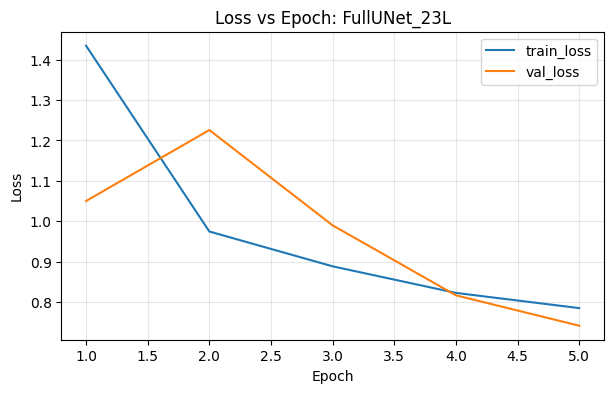

Best epoch: 5 | Best val_f1_macro: 0.7974153757095337


In [67]:
RESULTS_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/model_results")
MODEL_NAME = "FullUNet_23L"
METRICS_JSON = RESULTS_DIR / f"{MODEL_NAME}_best_metrics.json"

assert METRICS_JSON.exists(), f"Missing metrics JSON: {METRICS_JSON}"

with open(METRICS_JSON, "r") as f:
    data = json.load(f)

history = data["history"]
epochs = [h["epoch"] for h in history]
train_loss = [h["train_loss"] for h in history]
val_loss   = [h["val_loss"] for h in history]

plt.figure(figsize=(7,4))
plt.plot(epochs, train_loss, label="train_loss")
plt.plot(epochs, val_loss, label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss vs Epoch: {MODEL_NAME}")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("Best epoch:", data["best"]["epoch"], "| Best val_f1_macro:", data["best"]["val_f1_macro"])


**Locked Visuals for Analysis of Models**

/tmp/ipython-input-3330867802.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


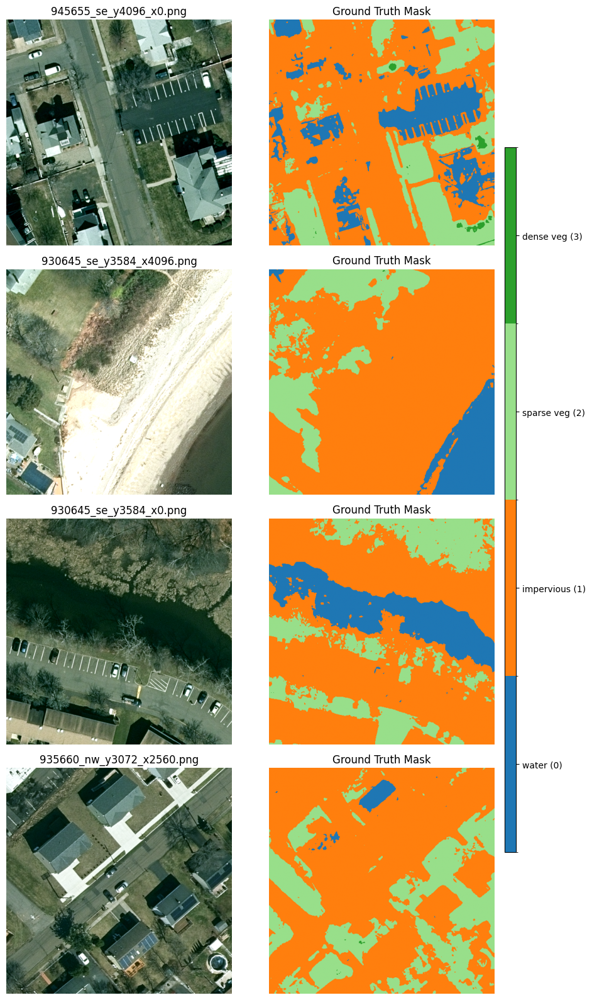

In [17]:
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# Locked tiles
FIXED_TILES = [
    "945655_se_y4096_x0.png",
    "930645_se_y3584_x4096.png",
    "930645_se_y3584_x0.png",
    "935660_nw_y3072_x2560.png",
]

# Class setup
class_names  = ["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"]
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

n = len(FIXED_TILES)
fig, axes = plt.subplots(n, 2, figsize=(9, 4 * n))

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    rgb = np.array(Image.open(img_fp).convert("RGB"))
    mask = np.array(Image.open(msk_fp))
    if mask.ndim == 3:
        mask = mask[..., 0]

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # Mask
    im = axes[i, 1].imshow(mask, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth Mask")
    axes[i, 1].axis("off")

#Colorbar
cax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(
    im,
    cax=cax,
    ticks=[0, 1, 2, 3]
)
cbar.set_ticklabels([
    "water (0)",
    "impervious (1)",
    "sparse veg (2)",
    "dense veg (3)"
])
plt.tight_layout()
plt.show()

**UNet Model RGB vs Ground Truth vs Prediction Visualization**

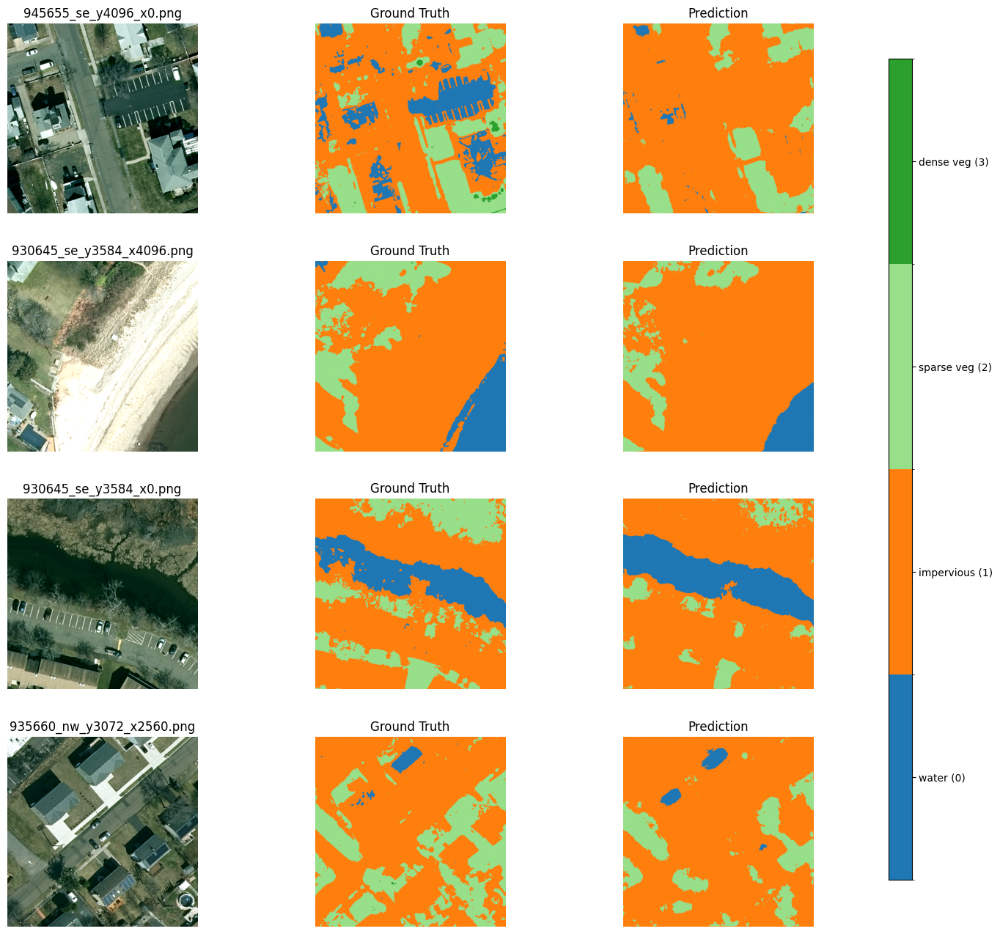

In [87]:
# --- Paths ---
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_OUT = TILES_BASE / "images"
MSK_OUT = TILES_BASE / "masks"

# --- Locked comparison tiles ---
FIXED_TILES = [
    "945655_se_y4096_x0.png",
    "930645_se_y3584_x4096.png",
    "930645_se_y3584_x0.png",
    "935660_nw_y3072_x2560.png",
]

# --- Load BEST checkpoint for this model ---
CKPT_PATH = Path("/content/drive/MyDrive/ResearchProject (1)/model_results/FullUNet_23L_best.pt")

model = model_unet
state = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(state)
model.to(DEVICE)
model.eval()

# --- Mask colormap ---
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap_mask.N)

def load_rgb_tile(img_fp: Path):
    """Returns (H,W,3) uint8 and (1,3,H,W) float32 tensor in [0,1]."""
    rgb_u8 = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)
    x = torch.from_numpy(rgb_u8).permute(2, 0, 1).float() / 255.0  # (3,H,W)
    x = x.unsqueeze(0)  # (1,3,H,W)
    return rgb_u8, x

def load_mask_tile(msk_fp: Path):
    """Returns (H,W) uint8 labels 0..3."""
    return np.array(Image.open(msk_fp), dtype=np.uint8)

@torch.no_grad()
def predict_tile(model, x):
    """x: (1,3,H,W) -> pred: (H,W) uint8"""
    x = x.to(DEVICE, non_blocking=True)
    logits = model(x)
    # Some segmentation models return dict with "out"
    if isinstance(logits, dict):
        logits = logits["out"]
    pred = torch.argmax(logits, dim=1).squeeze(0).detach().cpu().numpy().astype(np.uint8)
    return pred

# --- Plot: RGB | GT | Pred ---
rows = len(FIXED_TILES)
fig, axs = plt.subplots(rows, 3, figsize=(16, 4 * rows))

for i, name in enumerate(FIXED_TILES):
    img_fp = IMG_OUT / name
    msk_fp = MSK_OUT / f"{Path(name).stem}_mask.png"

    rgb_u8, x = load_rgb_tile(img_fp)
    gt = load_mask_tile(msk_fp)
    pred = predict_tile(model, x)

    axs[i, 0].imshow(rgb_u8)
    axs[i, 0].set_title(name)
    axs[i, 0].axis("off")

    im_gt = axs[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axs[i, 1].set_title("Ground Truth")
    axs[i, 1].axis("off")

    im_pred = axs[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axs[i, 2].set_title("Prediction")
    axs[i, 2].axis("off")

# Leave room on right for colorbar
fig.subplots_adjust(right=0.90, wspace=0.05, hspace=0.25)

# Colorbar axis (outside plots)
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im_pred, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.show()

**DeepLabV3-ResNet50 Model**

In [25]:
MODEL_NAME = "DeepLabV3_ResNet50"
NUM_CLASSES = 4

# Load pretrained backbone weights
model = torchvision.models.segmentation.deeplabv3_resnet50(
    weights=torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT
)

# Replaced classifier head so output channels = num classes
in_ch = model.classifier[-1].in_channels
model.classifier[-1] = nn.Conv2d(in_ch, NUM_CLASSES, kernel_size=1)

# If aux classifier exists, match it too (safe)
if model.aux_classifier is not None:
    in_ch_aux = model.aux_classifier[-1].in_channels
    model.aux_classifier[-1] = nn.Conv2d(in_ch_aux, NUM_CLASSES, kernel_size=1)

model = model.to(DEVICE)

print("Model:", MODEL_NAME)
print("Output head channels:", NUM_CLASSES)


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:01<00:00, 162MB/s]


Model: DeepLabV3_ResNet50
Output head channels: 4


**Train DeepLabV3-ResNet50 Model**

In [26]:
best_deeplab, hist_deeplab = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
)


[DeepLabV3_ResNet50] Epoch 01/10 | val_f1=0.5693 val_iou=0.4734 loss=1.1078 | time(train/val)=630.4s/72.5s
[DeepLabV3_ResNet50] Epoch 02/10 | val_f1=0.6750 val_iou=0.5803 loss=0.8432 | time(train/val)=24.2s/1.7s
[DeepLabV3_ResNet50] Epoch 03/10 | val_f1=0.5671 val_iou=0.4651 loss=1.1047 | time(train/val)=28.1s/1.6s
[DeepLabV3_ResNet50] Epoch 04/10 | val_f1=0.7805 val_iou=0.6594 loss=0.7797 | time(train/val)=24.3s/1.7s
[DeepLabV3_ResNet50] Epoch 05/10 | val_f1=0.7585 val_iou=0.6296 loss=0.8537 | time(train/val)=28.1s/1.7s
[DeepLabV3_ResNet50] Epoch 06/10 | val_f1=0.7083 val_iou=0.5641 loss=0.9607 | time(train/val)=24.3s/1.7s
[DeepLabV3_ResNet50] Epoch 07/10 | val_f1=0.8105 val_iou=0.6943 loss=0.6937 | time(train/val)=24.5s/1.7s
[DeepLabV3_ResNet50] Epoch 08/10 | val_f1=0.7248 val_iou=0.5793 loss=0.9011 | time(train/val)=28.3s/1.7s
[DeepLabV3_ResNet50] Epoch 09/10 | val_f1=0.6324 val_iou=0.5001 loss=1.0434 | time(train/val)=24.4s/1.7s
[DeepLabV3_ResNet50] Epoch 10/10 | val_f1=0.8052 val_

**DeepLabV3-ResNet50 Loss vs Epoch Graph**

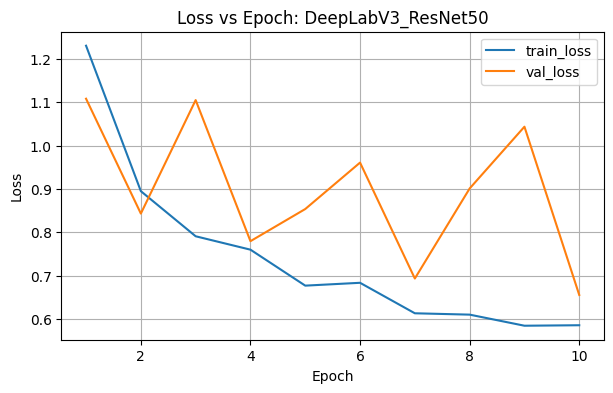

Best epoch: 7 | Best val_f1_macro: 0.810496985912323


In [27]:
def plot_loss(history, title="Loss vs Epoch"):
    epochs = [row["epoch"] for row in history]
    train_loss = [row["train_loss"] for row in history]
    val_loss = [row["val_loss"] for row in history]

    plt.figure(figsize=(7,4))
    plt.plot(epochs, train_loss, label="train_loss")
    plt.plot(epochs, val_loss, label="val_loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_loss(hist_deeplab, title="Loss vs Epoch: DeepLabV3_ResNet50")
print(f"Best epoch: {best_deeplab['epoch']} | Best val_f1_macro: {best_deeplab['val_f1_macro']}")

**DeepLabV3-ResNet50 Model RGB vs Ground Truth vs Prediction Visualization**

Loading checkpoint: /content/drive/MyDrive/ResearchProject (1)/model_results/DeepLabV3_ResNet50_best.pt


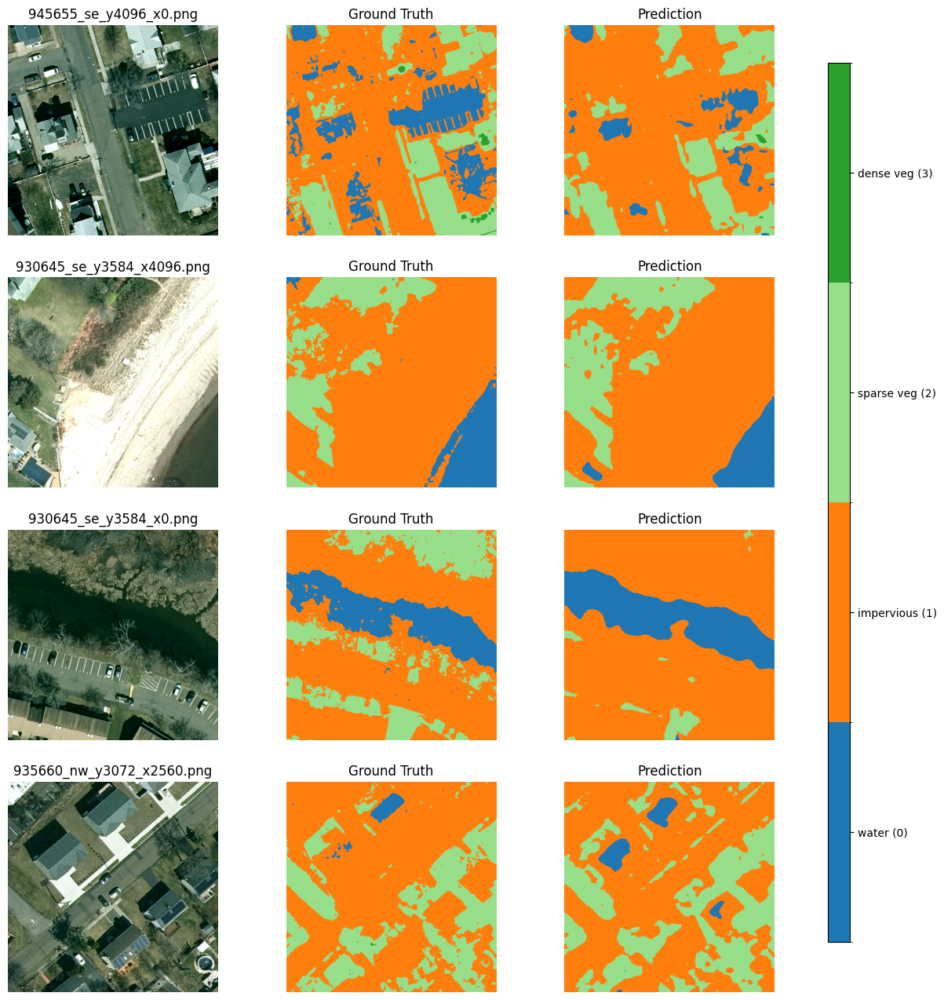

In [28]:
# ---- paths ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# ---- locked tiles ----
FIXED_TILES = [
    "945655_se_y4096_x0.png",
    "930645_se_y3584_x4096.png",
    "930645_se_y3584_x0.png",
    "935660_nw_y3072_x2560.png",
]

# ---- load best checkpoint weights into the SAME model object ----
ckpt_path = Path(best_deeplab["path_ckpt"])
print("Loading checkpoint:", ckpt_path)
model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
model.eval()

# ---- colormap ----
# 0 water, 1 impervious, 2 sparse veg, 3 dense veg
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm(boundaries=[-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# ---- plotting ----
fig, axes = plt.subplots(len(FIXED_TILES), 3, figsize=(14, 4*len(FIXED_TILES)))

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    assert img_fp.exists(), f"Missing image: {img_fp}"
    assert msk_fp.exists(), f"Missing mask: {msk_fp}"

    # load RGB (uint8 H,W,3)
    rgb = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)

    # load GT mask (uint8 H,W)
    gt = np.array(Image.open(msk_fp), dtype=np.uint8)
    if gt.ndim == 3:
        gt = gt[:, :, 0].astype(np.uint8)

    # model input: float32 (1,3,H,W) in [0,1]
    x = torch.from_numpy(rgb).permute(2, 0, 1).float().unsqueeze(0) / 255.0
    x = x.to(DEVICE)

    with torch.no_grad():
        out = model(x)
        if isinstance(out, dict):
            out = out["out"]
        pred = torch.argmax(out, dim=1).squeeze(0).detach().cpu().numpy().astype(np.uint8)

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # GT
    axes[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    # Pred
    im = axes[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

# single colorbar on the far right (not on top of images)
fig.subplots_adjust(right=0.88, wspace=0.02)
cax = fig.add_axes([0.90, 0.15, 0.02, 0.70])
cbar = fig.colorbar(im, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.show()


**U-Net + SCSE (ResNet-34 encoder) Model**

In [31]:
MODEL_NAME = "UNet_SCSE_ResNet34"
ENCODER = "resnet34"
ENCODER_WEIGHTS = "imagenet"

model_scas = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3,
    classes=4,
    activation=None,
    decoder_attention_type="scse"  #attention
).to(DEVICE)

print("Model:", MODEL_NAME)
print("Encoder:", ENCODER)
print("Decoder attention:", "scse")


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 229MB/s]


Model: UNet_SCSE_ResNet34
Encoder: resnet34
Decoder attention: scse


**Train U-Net + SCSE (ResNet-34 encoder)**

In [32]:
best_scas, hist_scas = train_model(
    model=model_scas,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
)


[UNet_SCSE_ResNet34] Epoch 01/10 | val_f1=0.6051 val_iou=0.5125 loss=1.0524 | time(train/val)=15.7s/1.9s
[UNet_SCSE_ResNet34] Epoch 02/10 | val_f1=0.6269 val_iou=0.5411 loss=0.9240 | time(train/val)=15.6s/1.8s
[UNet_SCSE_ResNet34] Epoch 03/10 | val_f1=0.5980 val_iou=0.5056 loss=0.9414 | time(train/val)=17.4s/1.7s
[UNet_SCSE_ResNet34] Epoch 04/10 | val_f1=0.6613 val_iou=0.5924 loss=0.7540 | time(train/val)=15.7s/1.8s
[UNet_SCSE_ResNet34] Epoch 05/10 | val_f1=0.7093 val_iou=0.6050 loss=0.7941 | time(train/val)=17.6s/1.7s
[UNet_SCSE_ResNet34] Epoch 06/10 | val_f1=0.7496 val_iou=0.6386 loss=0.7511 | time(train/val)=17.5s/1.7s
[UNet_SCSE_ResNet34] Epoch 07/10 | val_f1=0.7669 val_iou=0.6460 loss=0.8039 | time(train/val)=17.4s/1.7s
[UNet_SCSE_ResNet34] Epoch 08/10 | val_f1=0.7836 val_iou=0.6633 loss=0.7398 | time(train/val)=17.3s/1.7s
[UNet_SCSE_ResNet34] Epoch 09/10 | val_f1=0.6568 val_iou=0.5417 loss=1.0166 | time(train/val)=17.3s/1.7s
[UNet_SCSE_ResNet34] Epoch 10/10 | val_f1=0.7885 val_io

**U-Net + SCSE (ResNet-34 encoder) Model Loss vs Epoch Graph**

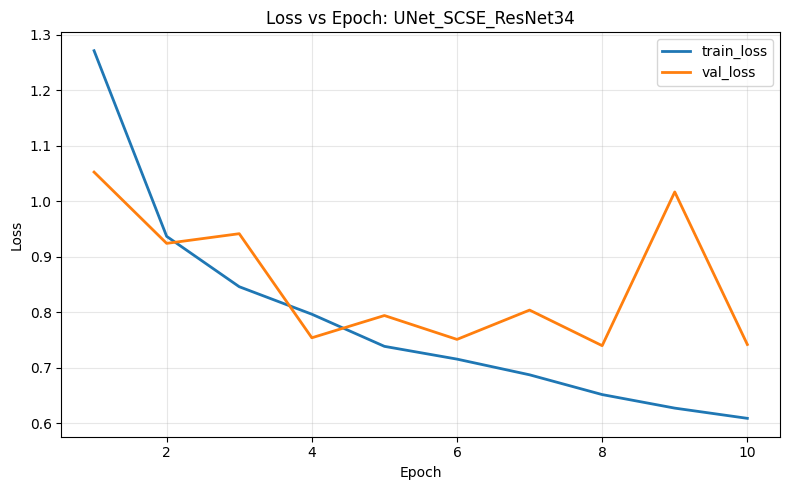

Best epoch: 10 | Best val_f1_macro: 0.7885


In [33]:
# === Load metrics ===
MODEL_NAME = "UNet_SCSE_ResNet34"
metrics_path = Path("/content/drive/MyDrive/ResearchProject (1)/model_results") / f"{MODEL_NAME}_best_metrics.json"

with open(metrics_path, "r") as f:
    data = json.load(f)

history = data["history"]

epochs = [h["epoch"] for h in history]
train_loss = [h["train_loss"] for h in history]
val_loss = [h["val_loss"] for h in history]

best_epoch = data["best"]["epoch"]
best_f1 = data["best"]["val_f1_macro"]

# === Plot ===
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_loss, label="train_loss", linewidth=2)
plt.plot(epochs, val_loss, label="val_loss", linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss vs Epoch: {MODEL_NAME}")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Best epoch: {best_epoch} | Best val_f1_macro: {best_f1:.4f}")


**U-Net + SCSE (ResNet-34 encoder) Model RGB vs Ground Truth vs Prediction Visualization**

Device: cuda
Loading checkpoint: /content/drive/MyDrive/ResearchProject (1)/model_results/UNet_SCSE_ResNet34_best.pt


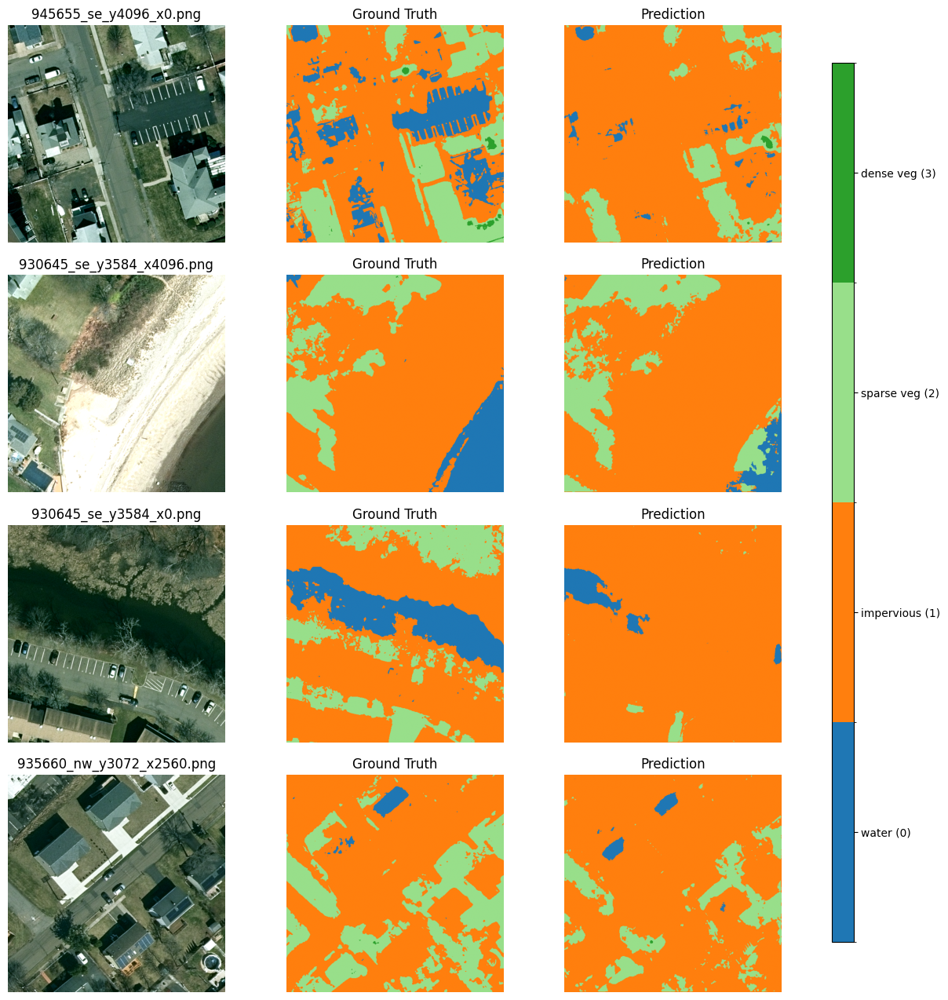

In [35]:
# --- paths ---
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# --- locked tiles ---
FIXED_TILES = [
    "945655_se_y4096_x0.png",
    "930645_se_y3584_x4096.png",
    "930645_se_y3584_x0.png",
    "935660_nw_y3072_x2560.png",
]

# --- device ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

MODEL_NAME = "UNet_SCSE_ResNet34"
ENCODER = "resnet34"
ENCODER_WEIGHTS = "imagenet"

model = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3,
    classes=4,
    activation=None,
    decoder_attention_type="scse",
).to(DEVICE)

# --- load best checkpoint ---
CKPT_PATH = Path("/content/drive/MyDrive/ResearchProject (1)/model_results/UNet_SCSE_ResNet34_best.pt")
print("Loading checkpoint:", CKPT_PATH)
state = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(state)
model.eval()

# --- colormap ---
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm(boundaries=[-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# --- plotting ---
fig, axes = plt.subplots(len(FIXED_TILES), 3, figsize=(14, 4 * len(FIXED_TILES)))

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    assert img_fp.exists(), f"Missing image: {img_fp}"
    assert msk_fp.exists(), f"Missing mask: {msk_fp}"

    # RGB + GT
    rgb = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)
    gt = np.array(Image.open(msk_fp), dtype=np.uint8)
    if gt.ndim == 3:
        gt = gt[:, :, 0].astype(np.uint8)

    # model input: (1,3,H,W) float in [0,1]
    x = torch.from_numpy(rgb).permute(2, 0, 1).float().unsqueeze(0) / 255.0
    x = x.to(DEVICE)

    with torch.no_grad():
        out = model(x)
        pred = torch.argmax(out, dim=1).squeeze(0).detach().cpu().numpy().astype(np.uint8)

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # GT
    axes[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    # Pred
    im = axes[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

# --- single colorbar on the right (not on top of images) ---
fig.subplots_adjust(right=0.88, wspace=0.02, hspace=0.15)
cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.show()


**SPANetFull (ResNet50 backbone) Model**

In [36]:
# ============================================================
# SPANetFull Model (ResNet50 backbone) + Train
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet50, ResNet50_Weights

MODEL_NAME = "SPANetFull_ResNet50"
print("Model:", MODEL_NAME)

# ----------------------------
# ResNet50 encoder (low + high)
# ----------------------------
class ResNet50Encoder(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        weights = ResNet50_Weights.DEFAULT if pretrained else None
        base = resnet50(weights=weights)

        self.stem = nn.Sequential(
            base.conv1,
            base.bn1,
            base.relu,
            base.maxpool,   # -> H/4, W/4
        )
        self.layer1 = base.layer1   # -> H/4,  W/4,  C=256
        self.layer2 = base.layer2   # -> H/8,  W/8,  C=512   (low)
        self.layer3 = base.layer3   # -> H/16, W/16, C=1024
        self.layer4 = base.layer4   # -> H/32, W/32, C=2048  (high)

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        low = self.layer2(x)         # (B,512,H/8,W/8)
        x = self.layer3(low)
        high = self.layer4(x)        # (B,2048,H/32,W/32)
        return low, high


# ---------------------------------------------
# SPAM block (successive pooling attention)
# ---------------------------------------------
class SPAMBlock(nn.Module):
    def __init__(self, in_channels, pool_sizes=(1, 2, 4), reduction=4):
        super().__init__()
        self.pool_sizes = pool_sizes
        mid_channels = max(in_channels // reduction, 1)

        self.conv_reduce = nn.Conv2d(in_channels * len(pool_sizes), mid_channels, kernel_size=1, bias=False)
        self.bn_reduce = nn.BatchNorm2d(mid_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv_attn = nn.Conv2d(mid_channels, in_channels, kernel_size=1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        B, C, H, W = x.shape
        pooled_list = []
        for ps in self.pool_sizes:
            p = F.adaptive_avg_pool2d(x, output_size=(ps, ps))
            p = F.interpolate(p, size=(H, W), mode="bilinear", align_corners=False)
            pooled_list.append(p)

        multi_scale = torch.cat(pooled_list, dim=1)              # (B, C*len(pool_sizes), H, W)
        h = self.relu(self.bn_reduce(self.conv_reduce(multi_scale)))
        attn = self.sigmoid(self.conv_attn(h))                   # (B, C, H, W)
        return x * attn


# ---------------------------------------------
# Feature Fusion Module (high -> gate low)
# ---------------------------------------------
class FeatureFusionModule(nn.Module):
    def __init__(self, low_channels, high_channels):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        mid_channels = max(low_channels // 4, 1)

        self.conv1 = nn.Conv2d(high_channels, mid_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(mid_channels, low_channels, kernel_size=1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, low, high):
        B, C_l, H_l, W_l = low.shape

        h = self.pool(high)                     # (B, C_h, 1, 1)
        h = self.relu(self.bn1(self.conv1(h)))  # (B, mid, 1, 1)
        h = self.sigmoid(self.conv2(h))         # (B, C_l, 1, 1)

        attn = h.expand(-1, -1, H_l, W_l)
        fused = low * attn
        return fused


# ---------------------------------------------
# Full SPANet-style segmentation network
# ---------------------------------------------
class SPANetFull(nn.Module):
    def __init__(self, num_classes=4, pretrained_backbone=True):
        super().__init__()
        self.encoder = ResNet50Encoder(pretrained=pretrained_backbone)

        self.low_ch = 512
        self.high_ch = 2048

        self.spam_low = SPAMBlock(self.low_ch)
        self.spam_high = SPAMBlock(self.high_ch)

        self.ffm = FeatureFusionModule(self.low_ch, self.high_ch)

        # simple decoder
        self.dec_conv1 = nn.Conv2d(self.low_ch, 256, kernel_size=3, padding=1)
        self.dec_bn1 = nn.BatchNorm2d(256)
        self.dec_conv2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.dec_bn2 = nn.BatchNorm2d(128)

        self.classifier = nn.Conv2d(128, num_classes, kernel_size=1)

    def forward(self, x):
        H, W = x.shape[-2:]
        low, high = self.encoder(x)

        low_enh = self.spam_low(low)
        high_enh = self.spam_high(high)

        fused_low = self.ffm(low_enh, high_enh)         # (B,512,H/8,W/8)

        y = self.dec_bn1(F.relu(self.dec_conv1(fused_low)))
        y = F.interpolate(y, scale_factor=2, mode="bilinear", align_corners=False)  # -> H/4

        y = self.dec_bn2(F.relu(self.dec_conv2(y)))
        y = F.interpolate(y, size=(H, W), mode="bilinear", align_corners=False)     # -> H,W

        logits = self.classifier(y)  # (B, num_classes, H, W)
        return logits


Model: SPANetFull_ResNet50


**Train SPANetFull (ResNet50 backbone) Model**

In [37]:
model_spanet = SPANetFull(num_classes=4, pretrained_backbone=True).to(DEVICE)

best_spanet, hist_spanet = train_model(
    model=model_spanet,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 240MB/s]


[SPANetFull_ResNet50] Epoch 01/10 | val_f1=0.7411 val_iou=0.6224 loss=0.9439 | time(train/val)=26.6s/1.8s
[SPANetFull_ResNet50] Epoch 02/10 | val_f1=0.6191 val_iou=0.5049 loss=1.0190 | time(train/val)=26.4s/1.8s
[SPANetFull_ResNet50] Epoch 03/10 | val_f1=0.7708 val_iou=0.6572 loss=0.8157 | time(train/val)=26.2s/1.8s
[SPANetFull_ResNet50] Epoch 04/10 | val_f1=0.6364 val_iou=0.5196 loss=1.0142 | time(train/val)=28.7s/1.7s
[SPANetFull_ResNet50] Epoch 05/10 | val_f1=0.7829 val_iou=0.6647 loss=0.8126 | time(train/val)=26.4s/1.7s
[SPANetFull_ResNet50] Epoch 06/10 | val_f1=0.6893 val_iou=0.5709 loss=0.9100 | time(train/val)=28.5s/1.7s
[SPANetFull_ResNet50] Epoch 07/10 | val_f1=0.7318 val_iou=0.6152 loss=0.8365 | time(train/val)=26.4s/1.7s
[SPANetFull_ResNet50] Epoch 08/10 | val_f1=0.7837 val_iou=0.6579 loss=0.8530 | time(train/val)=26.2s/1.7s
[SPANetFull_ResNet50] Epoch 09/10 | val_f1=0.7901 val_iou=0.6755 loss=0.7504 | time(train/val)=28.6s/1.7s
[SPANetFull_ResNet50] Epoch 10/10 | val_f1=0.8

**SPANetFull (ResNet50 backbone) Model Loss vs Epoch Graph**

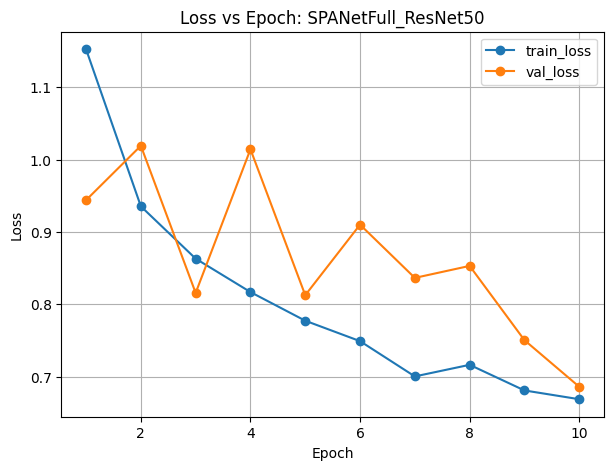

Best epoch: 10 | Best val_f1_macro: 0.8272


In [39]:
epochs = [h["epoch"] for h in hist_spanet]
train_loss = [h["train_loss"] for h in hist_spanet]
val_loss = [h["val_loss"] for h in hist_spanet]

plt.figure(figsize=(7,5))
plt.plot(epochs, train_loss, marker="o", label="train_loss")
plt.plot(epochs, val_loss, marker="o", label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss vs Epoch: SPANetFull_ResNet50")
plt.legend()
plt.grid(True)
plt.show()

print(
    f"Best epoch: {best_spanet['epoch']} | "
    f"Best val_f1_macro: {best_spanet['val_f1_macro']:.4f}"
)

**SPANetFull (ResNet50 backbone) Model RGB vs Ground Truth vs Prediction Visualization**

Loading checkpoint: /content/drive/MyDrive/ResearchProject (1)/model_results/SPANetFull_ResNet50_best.pt


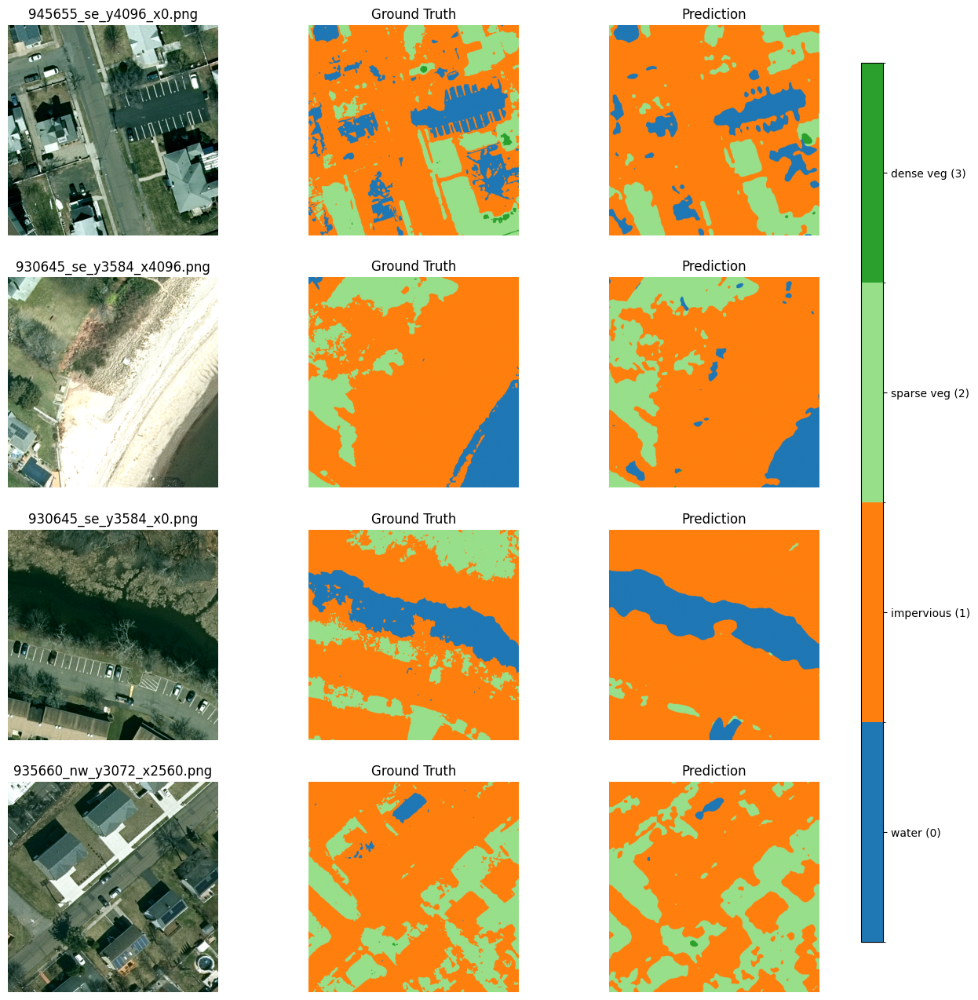

In [40]:
# ---- paths ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject (1)/dataset_tiles_512")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# ---- reload model ----
model = SPANetFull(num_classes=4, pretrained_backbone=False).to(DEVICE)
ckpt_path = Path(best_spanet["path_ckpt"])
print("Loading checkpoint:", ckpt_path)
model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
model.eval()

# ---- colormap ----
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

fig, axes = plt.subplots(len(FIXED_TILES), 3, figsize=(14, 4*len(FIXED_TILES)))

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    rgb = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)
    gt = np.array(Image.open(msk_fp), dtype=np.uint8)
    if gt.ndim == 3:
        gt = gt[:, :, 0]

    x = torch.from_numpy(rgb).permute(2, 0, 1).float().unsqueeze(0) / 255.0
    x = x.to(DEVICE)

    with torch.no_grad():
        logits = model(x)
        pred = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    axes[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    im = axes[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

# ---- single colorbar (right side) ----
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cax, ticks=[0,1,2,3])
cbar.set_ticklabels([
    "water (0)",
    "impervious (1)",
    "sparse veg (2)",
    "dense veg (3)"
])

plt.show()

**Comparison Table**

In [41]:
RESULTS_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/model_results")

MODELS = {
    "UNet": "FullUNet_23L_best_metrics.json",
    "DeepLabV3-ResNet50": "DeepLabV3_ResNet50_best_metrics.json",
    "UNet + SCSE": "UNet_SCSE_ResNet34_best_metrics.json",
    "SPANetFull": "SPANetFull_ResNet50_best_metrics.json",
}

rows = []

for model_name, fname in MODELS.items():
    path = RESULTS_DIR / fname
    with open(path, "r") as f:
        data = json.load(f)

    best = data["best"]

    row = {
        "Model": model_name,
        "Best Epoch": best["epoch"],
        "Mean F1 (macro)": best["val_f1_macro"],
        "Mean IoU (macro)": best["val_iou_macro"],
        "Pixel Accuracy": best["val_pixel_acc"],

        # Per-class F1
        "F1 Water": best["val_f1_per_class"][0],
        "F1 Impervious": best["val_f1_per_class"][1],
        "F1 Sparse Veg": best["val_f1_per_class"][2],
        "F1 Dense Veg": best["val_f1_per_class"][3],

        # Per-class Precision
        "Prec Water": best["val_prec_per_class"][0],
        "Prec Impervious": best["val_prec_per_class"][1],
        "Prec Sparse Veg": best["val_prec_per_class"][2],
        "Prec Dense Veg": best["val_prec_per_class"][3],

        # Per-class Recall
        "Recall Water": best["val_rec_per_class"][0],
        "Recall Impervious": best["val_rec_per_class"][1],
        "Recall Sparse Veg": best["val_rec_per_class"][2],
        "Recall Dense Veg": best["val_rec_per_class"][3],
    }

    rows.append(row)

df = pd.DataFrame(rows)

# Sort by Mean F1 (descending)
df = df.sort_values("Mean F1 (macro)", ascending=False)

df

,Model,Best Epoch,Mean F1 (macro),Mean IoU (macro),Pixel Accuracy,F1 Water,F1 Impervious,F1 Sparse Veg,F1 Dense Veg,Prec Water,Prec Impervious,Prec Sparse Veg,Prec Dense Veg,Recall Water,Recall Impervious,Recall Sparse Veg,Recall Dense Veg
3,SPANetFull,10,0.827186,0.718798,0.883728,0.923105,0.898107,0.840071,0.647461,0.944968,0.890592,0.844883,0.585841,0.902232,0.905749,0.835313,0.723568
1,DeepLabV3-ResNet50,7,0.810497,0.694303,0.867211,0.910242,0.886405,0.809164,0.636176,0.949679,0.855322,0.853985,0.681282,0.873950,0.919833,0.768814,0.596672
0,UNet,5,0.797415,0.681574,0.870437,0.913799,0.892519,0.801705,0.581639,0.966748,0.837396,0.907415,0.642562,0.866348,0.955411,0.718054,0.531268
2,UNet + SCSE,10,0.788502,0.666660,0.862984,0.883206,0.888004,0.798296,0.584500,0.976749,0.823296,0.916132,0.726364,0.806014,0.963750,0.707318,0.488996


In [42]:
out_path = RESULTS_DIR / "model_comparison_table.csv"
df.to_csv(out_path, index=False)
print("Saved comparison table to:", out_path)

Saved comparison table to: /content/drive/MyDrive/ResearchProject (1)/model_results/model_comparison_table.csv


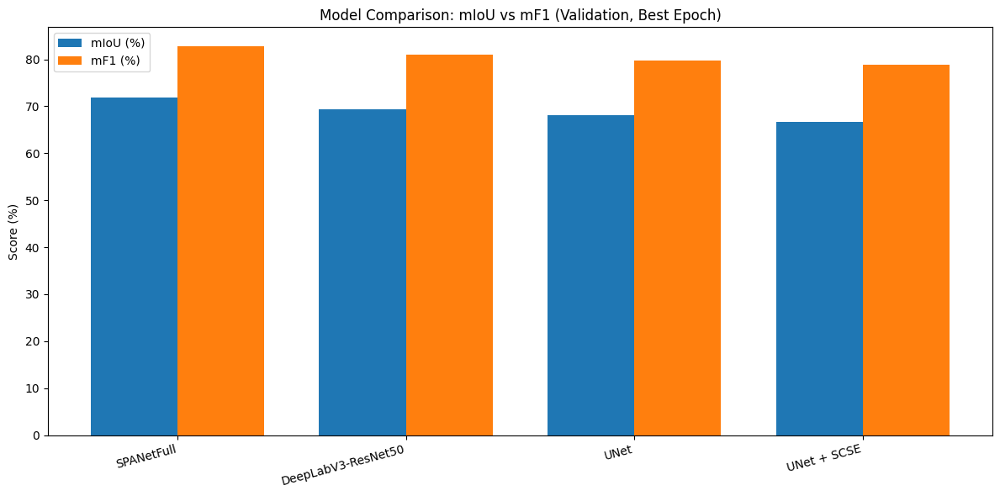

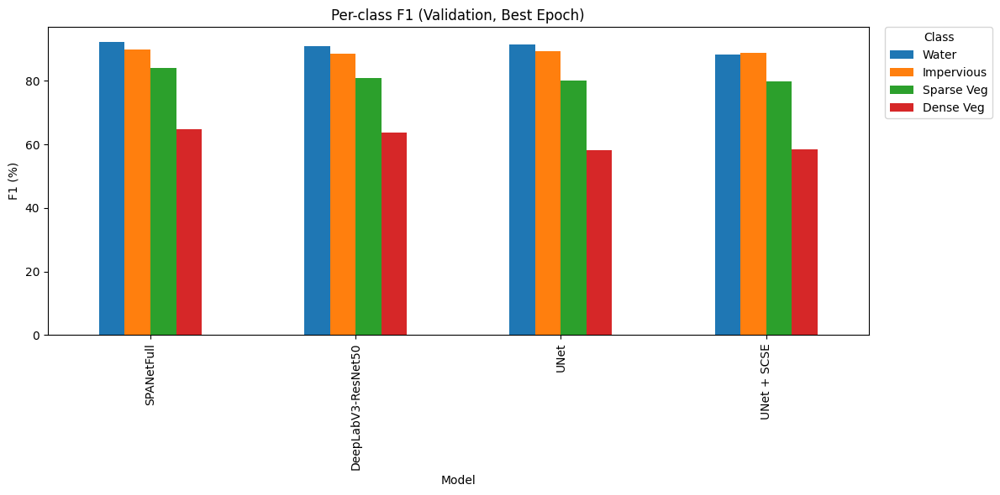

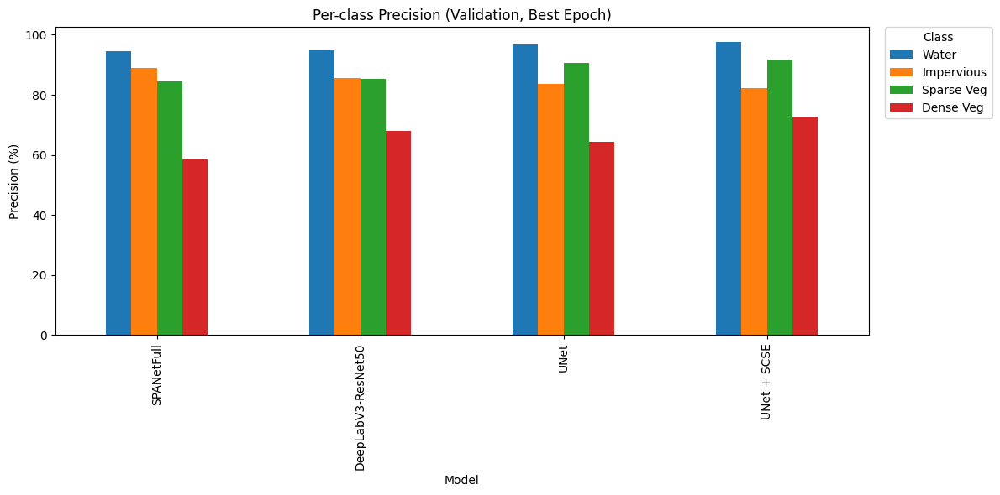

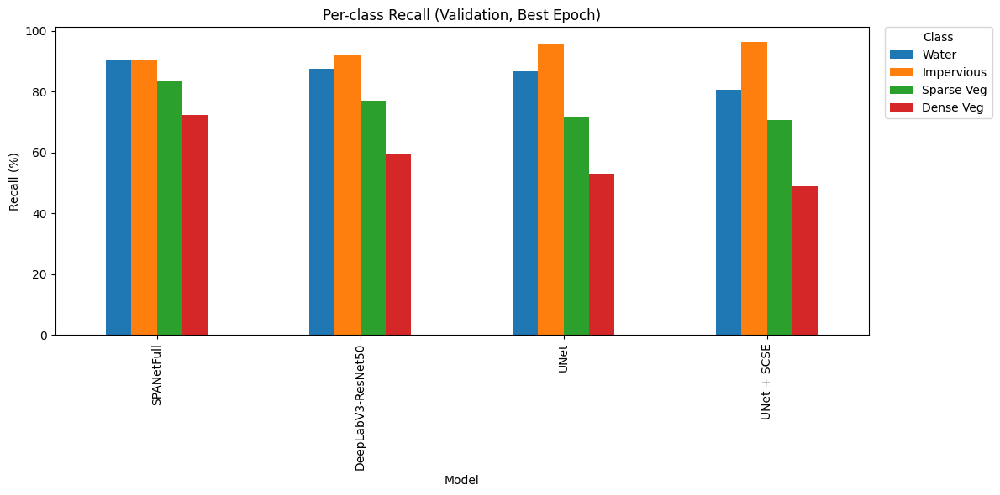

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------
# Expect df already exists from your "Comparison Table" cell
# Must contain:
#   "Model", "Mean F1 (macro)", "Mean IoU (macro)"
#   and per-class columns like:
#   F1 Water, F1 Impervious, F1 Sparse Veg, F1 Dense Veg
#   IoU Water, IoU Impervious, IoU Sparse Veg, IoU Dense Veg
#   Prec Water, Prec Impervious, Prec Sparse Veg, Prec Dense Veg
#   Recall Water, Recall Impervious, Recall Sparse Veg, Recall Dense Veg
# ----------------------------

CLASSES = ["Water", "Impervious", "Sparse Veg", "Dense Veg"]

# ---------- 1) Grouped bar: mIoU vs mF1 ----------
plot_df = df.copy()

# Convert to % for nicer chart (optional)
plot_df["mF1 (%)"]  = plot_df["Mean F1 (macro)"] * 100.0
plot_df["mIoU (%)"] = plot_df["Mean IoU (macro)"] * 100.0

x = np.arange(len(plot_df["Model"]))
w = 0.38

plt.figure(figsize=(12, 6))
plt.bar(x - w/2, plot_df["mIoU (%)"].values, width=w, label="mIoU (%)")
plt.bar(x + w/2, plot_df["mF1 (%)"].values,  width=w, label="mF1 (%)")
plt.xticks(x, plot_df["Model"].values, rotation=15, ha="right")
plt.ylabel("Score (%)")
plt.title("Model Comparison: mIoU vs mF1 (Validation, Best Epoch)")
plt.legend()
plt.tight_layout()
plt.show()


# ---------- Helper: make a wide per-class table from column prefix ----------
def wide_from_prefix(df_in: pd.DataFrame, prefix: str) -> pd.DataFrame:
    """
    Builds wide df with columns = CLASSES for a given metric prefix.
    Example prefix="F1" reads columns:
      F1 Water, F1 Impervious, F1 Sparse Veg, F1 Dense Veg
    """
    cols = [f"{prefix} {c}" for c in CLASSES]
    missing = [c for c in cols if c not in df_in.columns]
    if missing:
        raise KeyError(f"Missing columns for prefix '{prefix}': {missing}")

    wide = df_in[["Model"] + cols].copy()
    wide = wide.rename(columns={f"{prefix} {c}": c for c in CLASSES})
    wide = wide.set_index("Model")
    return wide.astype(float)


# ---------- 2) Per-class bar charts ----------
def plot_per_class(df_in: pd.DataFrame, prefix: str, title: str, ylabel: str, as_percent: bool = False):
    wide = wide_from_prefix(df_in, prefix)

    if as_percent:
        wide = wide * 100.0

    ax = wide.plot(kind="bar", figsize=(12, 6))
    ax.set_title(title)
    ax.set_ylabel(ylabel + (" (%)" if as_percent else ""))
    ax.set_xlabel("Model")
    ax.legend(title="Class", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
    plt.tight_layout()
    plt.show()

# F1 / IoU / Precision / Recall per class
plot_per_class(df, "F1",    "Per-class F1 (Validation, Best Epoch)",        "F1",        as_percent=True)
plot_per_class(df, "Prec",  "Per-class Precision (Validation, Best Epoch)", "Precision", as_percent=True)
plot_per_class(df, "Recall","Per-class Recall (Validation, Best Epoch)",    "Recall",    as_percent=True)
